In [1]:
import os
file_paths = []
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        file_paths.append(os.path.join(dirname, filename))
print(f"Total files found: {len(file_paths)}")

Total files found: 261081


In [2]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if torch.cuda.is_available():
    print(f"GPU is available: {torch.cuda.get_device_name(0)}")
else:
    print("GPU is not available.")

Using device: cuda
GPU is available: Tesla P100-PCIE-16GB


In [8]:
import os
import json
import pandas as pd
import random
from itertools import combinations, product
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
from pathlib import Path
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

In [9]:
# ---------- CONFIG ----------
ROOT = Path('/kaggle/input/polyvore-outfit-dataset/polyvore_outfits')
TRAIN_FILE = ROOT / 'nondisjoint/train.json'
SPLIT_RATIO = 0.2
NEG_MULTIPLIER = 6
OUTPUT_DIR = Path('/kaggle/working')
test_json = ROOT / 'nondisjoint/test.json'

In [10]:
def get_truncated_vgg16():
    vgg = models.vgg16(pretrained=True)
    child_layers = list(vgg.features.children())
    truncated = nn.Sequential(*child_layers[:31])  # Up to conv4_1

    # Freeze first 10 conv layers → up to layer index 22 (conv4_3)
    conv_count = 0
    for layer in child_layers:
        if isinstance(layer, nn.Conv2d):
            conv_count += 1
        if conv_count <= 10:
            for param in layer.parameters():
                param.requires_grad = False

    return truncated

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
truncated_vgg = get_truncated_vgg16().to(device)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 208MB/s] 


In [12]:
def extract_color_histogram(img_tensor, bins=8):
    """
    img_tensor: [3, H, W], range [0,1]
    Returns: histogram vector of shape [24]
    """
    hist = []
    for ch in img_tensor:
        h = torch.histc(ch.cpu(), bins=bins, min=0.0, max=1.0)
        h = h / (h.sum() + 1e-6)  # Normalize
        hist.append(h)
    return torch.cat(hist).to(img_tensor.device)  # return to original device

In [13]:
# -------- Siamese Merge Module --------
class SiameseMerge(nn.Module):
    def __init__(self):
        super().__init__()
        self.vgg = get_truncated_vgg16()

    def forward(self, img1, img2):
        """
        img1, img2: [B, 3, H, W], values in [0,1]
        """
        feat1 = self.vgg(img1)  # [B, 512, H', W']
        feat2 = self.vgg(img2)
        # print("VGG output shape:", feat1.shape)
        # print("VGG output shape:", feat2.shape)
        
        # Global average pool
        feat1 = F.adaptive_avg_pool2d(feat1, (1, 1)).squeeze(-1).squeeze(-1)  # [B, 512]
        feat2 = F.adaptive_avg_pool2d(feat2, (1, 1)).squeeze(-1).squeeze(-1)  # [B, 512]

        visual_hadamard = feat1 * feat2  # [B, 512]

        # Compute color histogram Hadamard
        batch_hist = []
        for i in range(img1.size(0)):
            h1 = extract_color_histogram(img1[i])
            h2 = extract_color_histogram(img2[i])
            batch_hist.append(h1 * h2)  # [24]
        hist_hadamard = torch.stack(batch_hist).to(img1.device)  # [B, 24]
        # print("Color hist shape:", h1.shape)
        # print("Color hist shape:", h2.shape)
        # Final feature
        merged_feature = torch.cat([visual_hadamard, hist_hadamard], dim=1)  # [B, 536]
        # print("Merged feature shape from siamese_merge:", merged_feature.shape)
        return merged_feature

In [14]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = SiameseMerge().to(device)
dummy_img1 = torch.randn(2, 3, 224, 224).to(device)
dummy_img2 = torch.randn(2, 3, 224, 224).to(device)

with torch.no_grad():
    output = model(dummy_img1, dummy_img2)

print(">>> Final merged feature dim:", output.shape[1])

>>> Final merged feature dim: 536


In [15]:
class MetricNetwork(nn.Module):
    def __init__(self, input_dim=536, dropout_prob=0.5):
        super().__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.dropout1 = nn.Dropout(dropout_prob)

        self.fc2 = nn.Linear(256, 64)
        self.bn2 = nn.BatchNorm1d(64)
        self.dropout2 = nn.Dropout(dropout_prob)

        self.fc3 = nn.Linear(64, 1)  # Output scalar compatibility score

    def forward(self, x):
        x = F.relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = F.relu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)
        score = self.fc3(x)  # Raw score (logit)
        return score.squeeze(1)  # [B]

    def predict(self, x):
        """
        Inference method to get probabilities (after sigmoid)
        """
        with torch.no_grad():
            logits = self.forward(x)
            probs = torch.sigmoid(logits)
        return probs

In [16]:
def update_lambda(W, eps=1e-5):
    norm = torch.norm(W).clamp(min=eps)
    return torch.eye(W.shape[1], device=W.device) * norm.item() ** 2

In [17]:
class MAPLoss(nn.Module):
    def __init__(self, metric_model, vgg_model, lambda1=1e-4, lambda2=1e-5, lambda3=1e-5):
        super().__init__()
        self.metric_model = metric_model
        self.vgg_model = vgg_model
        self.lambda1 = lambda1
        self.lambda2 = lambda2
        self.lambda3 = lambda3

    def forward(self, pred_logits, targets, lambdas):
        pred_logits = pred_logits.clamp(min=-100, max=100)  # Prevents inf logits
        bce = F.binary_cross_entropy_with_logits(pred_logits, targets.float())

        # Matrix-variate Gaussian prior
        tr_terms = []
        for fc_layer, key in zip([self.metric_model.fc1, self.metric_model.fc2], ['fc1', 'fc2']):
            Wj = fc_layer.weight
            Lambda_inv = torch.linalg.pinv(lambdas[key].clamp(min=1e-6, max=1e6))  # Regularized inverse
            Wj_T = Wj.transpose(0, 1)
            mat = Wj @ Lambda_inv @ Wj_T
            tr = torch.trace(mat.clamp(min=1e-6, max=1e6))  # Prevent exploding trace
            tr_terms.append(tr)
        trace_reg = sum(tr_terms)

        l1_cnn = sum(torch.sum(torch.abs(p)) for n, p in self.vgg_model.named_parameters() if p.requires_grad)
        l1_w = torch.sum(torch.abs(self.metric_model.fc3.weight))

        total_loss = (
            bce +
            self.lambda1 * trace_reg +
            self.lambda2 * l1_cnn +
            self.lambda3 * l1_w
        )
        return total_loss


In [18]:
import torch

# Path to the model file
model_path = "/kaggle/input/polania_5000/pytorch/default/1/best_model (4).pth"

# Rebuild your model structure
siamese_merge = SiameseMerge().to(device)
metric_model = MetricNetwork().to(device)

# Load checkpoint
checkpoint = torch.load(model_path, map_location=device)

siamese_merge.load_state_dict(checkpoint['siamese_merge_state_dict'])
metric_model.load_state_dict(checkpoint['metric_model_state_dict'])

# Set to eval mode
siamese_merge.eval()
metric_model.eval()

/tmp/ipykernel_31/619805236.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=device)


MetricNetwork(
  (fc1): Linear(in_features=536, out_features=256, bias=True)
  (bn1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout1): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_features=256, out_features=64, bias=True)
  (bn2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout2): Dropout(p=0.5, inplace=False)
  (fc3): Linear(in_features=64, out_features=1, bias=True)
)

In [19]:
import os
import json
import shutil
import pandas as pd
from tqdm import tqdm

# Paths
images_folder = '/kaggle/input/polyvore-outfit-dataset/polyvore_outfits/images'
output_gallery = '/kaggle/working/gallery'

# Load metadata.json (you'll load the full one on Kaggle)
with open('/kaggle/input/polyvore-outfit-dataset/polyvore_outfits/polyvore_item_metadata.json', 'r') as f:
    metadata = json.load(f)

# Load category mapping from CSV
categories_df = pd.read_csv('/kaggle/input/polyvore-outfit-dataset/polyvore_outfits/categories.csv')
category_dict = dict(zip(categories_df['category_id'].astype(str), categories_df['main_category']))


In [20]:
added = 0

for item_id, item in tqdm(metadata.items()):
    cat_id = item.get('category_id')
    sem_cat = item.get('semantic_category')

    # Map to main category using CSV or fallback to semantic_category
    main_cat = category_dict.get(str(cat_id), sem_cat)
    if not main_cat:
        continue

    # Create destination path
    dest_folder = os.path.join(output_gallery, main_cat)
    os.makedirs(dest_folder, exist_ok=True)

    # Try different image extensions
    for ext in ['jpg', 'jpeg', 'png']:
        img_path = os.path.join(images_folder, f"{item_id}.{ext}")
        if os.path.isfile(img_path):
            dest_path = os.path.join(dest_folder, f"{item_id}.jpg")
            shutil.copy(img_path, dest_path)
            added += 1
            break

print(f"\n Copied {added} images to category-wise gallery.")


100%|██████████| 251008/251008 [37:17<00:00, 112.17it/s]


 Copied 251008 images to category-wise gallery.


In [21]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match VGG input size
    transforms.ToTensor(),          # Convert PIL image to tensor
])

In [22]:
gallery_features = {}
missing_gallery = []

for main_category in os.listdir(output_gallery):
    category_path = os.path.join(output_gallery, main_category)
    all_item_ids = [f[:-4] for f in os.listdir(category_path) if f.endswith((".jpg", ".jpeg", ".png"))]

    print(f"\n Processing {main_category} with {len(all_item_ids)} items...")

    for item_id in tqdm(all_item_ids, desc=f"{main_category} Feature Extraction"):
        try:
            img_path = os.path.join(category_path, f"{item_id}.jpg")
            img = Image.open(img_path).convert("RGB")
            img_tensor = transform(img).unsqueeze(0).to(device)

            with torch.no_grad():
                visual_feat = siamese_merge.vgg(img_tensor)
                visual_feat = torch.nn.functional.adaptive_avg_pool2d(visual_feat, (1, 1)).squeeze()
                hist_feat = extract_color_histogram(img_tensor.squeeze(0))

            gallery_features[item_id] = {
                "visual": visual_feat.cpu(),
                "hist": hist_feat.cpu(),
                "category": main_category
            }

        except Exception as e:
            print(f" Error on {item_id}: {e}")
            missing_gallery.append(item_id)



 Processing jewellery with 4348 items...


jewellery Feature Extraction: 100%|██████████| 4348/4348 [00:32<00:00, 132.01it/s]



 Processing shoes with 44850 items...


shoes Feature Extraction: 100%|██████████| 44850/44850 [05:39<00:00, 132.03it/s]



 Processing accessories with 5158 items...


accessories Feature Extraction: 100%|██████████| 5158/5158 [00:39<00:00, 131.74it/s]



 Processing jewellery  with 37066 items...


jewellery  Feature Extraction: 100%|██████████| 37066/37066 [04:41<00:00, 131.51it/s]



 Processing bags with 40717 items...


bags Feature Extraction: 100%|██████████| 40717/40717 [05:11<00:00, 130.56it/s]



 Processing all-body with 18478 items...


all-body Feature Extraction: 100%|██████████| 18478/18478 [02:21<00:00, 130.64it/s]



 Processing scarves with 4898 items...


scarves Feature Extraction: 100%|██████████| 4898/4898 [00:37<00:00, 130.57it/s]



 Processing tops with 32998 items...


tops Feature Extraction: 100%|██████████| 32998/32998 [04:12<00:00, 130.90it/s]



 Processing accessories  with 1815 items...


accessories  Feature Extraction: 100%|██████████| 1815/1815 [00:13<00:00, 132.00it/s]



 Processing sunglasses with 9874 items...


sunglasses Feature Extraction: 100%|██████████| 9874/9874 [01:13<00:00, 133.50it/s]



 Processing bottoms with 27670 items...


bottoms Feature Extraction: 100%|██████████| 27670/27670 [03:32<00:00, 130.10it/s]



 Processing hats with 6071 items...


hats Feature Extraction: 100%|██████████| 6071/6071 [00:46<00:00, 131.51it/s]



 Processing outerwear with 17065 items...


outerwear Feature Extraction: 100%|██████████| 17065/17065 [02:11<00:00, 130.22it/s]


In [24]:
import torch
import numpy as np
from PIL import Image
from tqdm import tqdm

# This is loaded already
# metadata = ...
# gallery_features = {"item_id": {"visual": tensor, "hist": tensor, "category": str}}

# Load test outfit
with open("/kaggle/input/polyvore-outfit-dataset/polyvore_outfits/nondisjoint/test.json", 'r', encoding='utf-8') as f:
    test_outfits = json.load(f)

def extract_embedding(img_path):
    query_img = Image.open(img_path).convert("RGB")
    query_tensor = transform(query_img).unsqueeze(0).to(device)
    
    with torch.no_grad():
        visual_feat = siamese_merge.vgg(query_tensor)
        visual_feat = torch.nn.functional.adaptive_avg_pool2d(visual_feat, (1, 1)).squeeze()
        hist_feat = extract_color_histogram(query_tensor.squeeze(0))
    
    query_feat = {
        "visual": visual_feat,
        "hist": hist_feat
    }
    return query_feat

In [25]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_query_and_top_matches(query_id, query_cat, top_matches, images_folder, metadata, num_cols=5):
    num_categories = len(top_matches)
    plt.figure(figsize=(num_cols * 2, (num_categories + 1) * 2))

    # Display Query Image
    query_img_path = None
    for ext in ['jpg', 'jpeg', 'png']:
        temp_path = os.path.join(images_folder, f"{query_id}.{ext}")
        if os.path.isfile(temp_path):
            query_img_path = temp_path
            break

    if query_img_path:
        query_img = Image.open(query_img_path).convert('RGB')
        plt.subplot(num_categories + 1, num_cols, (1, num_cols))
        plt.imshow(query_img)
        plt.axis('off')
        plt.title(f"Query: {query_id}\n({query_cat})", fontsize=10)
    else:
        print(f"Query image {query_id} not found.")

    # Show Top Matches Per Category
    row = 1
    for cat, items in top_matches.items():
        for col, (item_id, score) in enumerate(items):
            img_path = None
            for ext in ['jpg', 'jpeg', 'png']:
                temp_path = os.path.join(images_folder, f"{item_id}.{ext}")
                if os.path.isfile(temp_path):
                    img_path = temp_path
                    break
            if not img_path:
                continue

            img = Image.open(img_path).convert('RGB')
            idx = row * num_cols + col + 1
            plt.subplot(num_categories + 1, num_cols, idx)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"{cat}\n{item_id}\n{score:.2f}", fontsize=7)

        row += 1

    plt.tight_layout()
    plt.show()

Processing Queries:   0%|          | 0/5 [00:00<?, ?it/s]


 Query: 193458045 (bags)
Top 5 from jewellery:
  179409663: -0.7331
  111066634: -0.7698
  140242932: -0.7913
  191551632: -0.7929
  169213788: -0.8038
Top 5 from shoes:
  206302334: -0.7188
  213481245: -0.7218
  201436985: -0.7336
  207658552: -0.7343
  212580395: -0.7346
Top 5 from accessories:
  197059239: -0.7276
  123161171: -0.7289
  147257105: -0.7389
  101317327: -0.7395
  191842107: -0.7421
Top 5 from jewellery :
  173492513: -0.6850
  204724516: -0.6853
  182581893: -0.6937
  212881613: -0.6976
  205528431: -0.7105
Top 5 from all-body:
  202555666: -0.7225
  158492805: -0.7295
  167900262: -0.7340
  210157888: -0.7368
  210137889: -0.7477
Top 5 from scarves:
  180971505: -0.7110
  146457421: -0.7531
  195303209: -0.7595
  66815149: -0.7620
  186200723: -0.7624
Top 5 from tops:
  87824330: -0.7113
  135781263: -0.7366
  205232091: -0.7408
  191558953: -0.7476
  15605667: -0.7494
Top 5 from accessories :
  177824908: -0.8092
  102923417: -0.8139
  35305640: -0.8163
  79462926

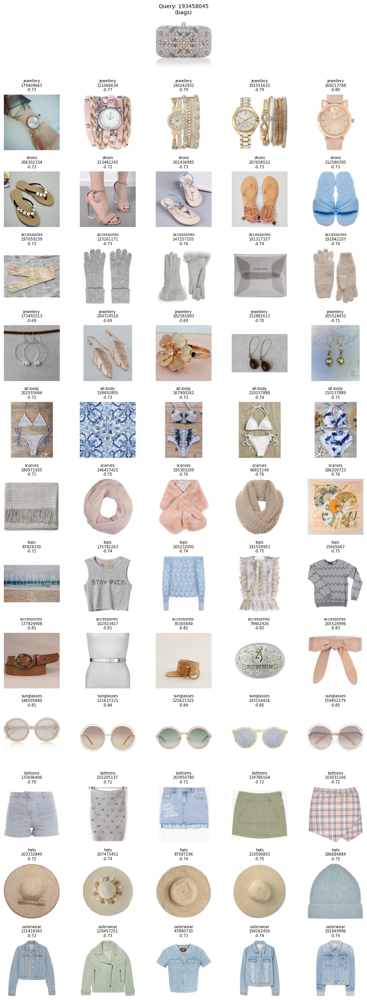

Processing Queries:  20%|██        | 1/5 [01:33<06:13, 93.33s/it]


 Query: 180793385 (shoes)
Top 5 from jewellery:
  142971055: -1.3794
  182868173: -1.4305
  80734819: -1.4629
  112768657: -1.4819
  28008710: -1.5095
Top 5 from accessories:
  129789973: -1.1988
  190547288: -1.1997
  39059296: -1.2039
  43546080: -1.2116
  151098739: -1.2155
Top 5 from jewellery :
  45478793: -0.8414
  45763328: -0.8420
  178908974: -1.1485
  187036814: -1.2532
  193943664: -1.3248
Top 5 from bags:
  208231586: -1.0206
  194377661: -1.0287
  129420817: -1.0618
  185257067: -1.1134
  177630907: -1.1244
Top 5 from all-body:
  193245154: -0.9556
  185049147: -1.0096
  112167696: -1.0135
  202362364: -1.0243
  189588198: -1.0527
Top 5 from scarves:
  181272195: -1.0620
  96964369: -1.1093
  47793813: -1.1157
  169022628: -1.1281
  100112981: -1.1716
Top 5 from tops:
  148526426: -0.9044
  205041620: -0.9151
  183461505: -0.9174
  178369855: -0.9236
  176667293: -0.9275
Top 5 from accessories :
  199969525: -1.3532
  141596326: -1.4266
  147524224: -1.4778
  140558421: -

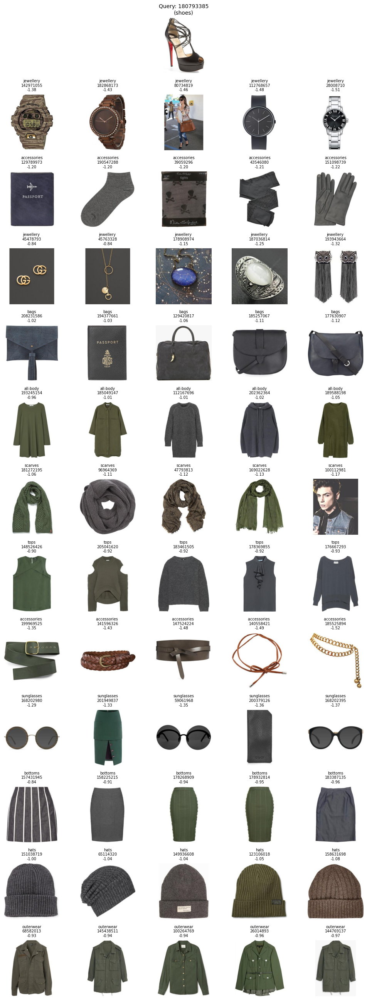

Processing Queries:  40%|████      | 2/5 [03:04<04:37, 92.35s/it]


 Query: 32286230 (bags)
Top 5 from jewellery:
  202140618: -1.0467
  180935473: -1.1411
  211920796: -1.1778
  142971055: -1.2057
  106899900: -1.2152
Top 5 from shoes:
  185100136: -0.9564
  115215734: -0.9738
  170330951: -0.9807
  165083829: -0.9860
  122028986: -0.9972
Top 5 from accessories:
  200659228: -0.8698
  118339602: -0.8994
  39059296: -0.9244
  210140477: -0.9272
  129789973: -0.9564
Top 5 from jewellery :
  45478793: -0.7729
  45763328: -0.7757
  178908974: -0.8605
  185626376: -0.9001
  146187028: -0.9011
Top 5 from all-body:
  180221100: -0.9343
  202362364: -0.9464
  193245154: -0.9467
  162155576: -0.9589
  112167696: -0.9690
Top 5 from scarves:
  176874663: -0.8540
  177153471: -0.8841
  146252706: -0.9021
  96964369: -0.9177
  151248410: -0.9346
Top 5 from tops:
  183461505: -0.8419
  205041620: -0.8532
  148526426: -0.8625
  202263095: -0.8645
  202602443: -0.8672
Top 5 from accessories :
  201459999: -1.0026
  199609590: -1.0674
  104394296: -1.1645
  70111323:

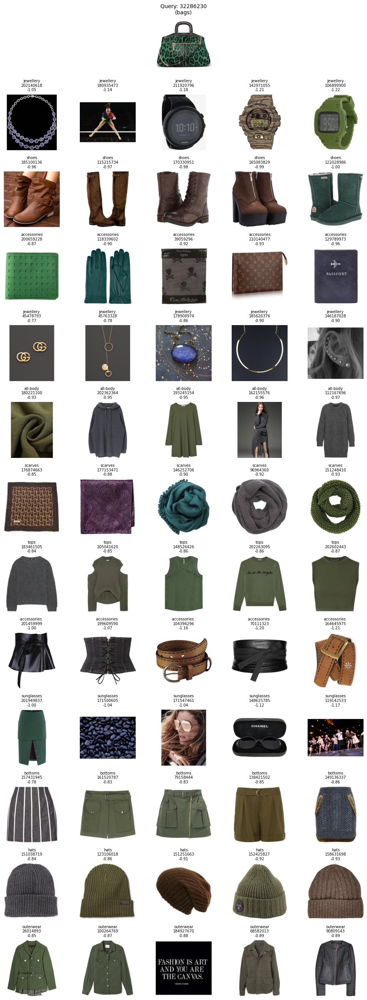

Processing Queries:  60%|██████    | 3/5 [04:39<03:06, 93.37s/it]


 Query: 158586279 (shoes)
Top 5 from jewellery:
  16177268: -0.7713
  200802028: -0.7730
  162042891: -0.7733
  187954448: -0.7740
  188450548: -0.7767
Top 5 from accessories:
  88308339: -0.7889
  180293838: -0.7914
  141208117: -0.7962
  113100345: -0.7980
  209546278: -0.8066
Top 5 from jewellery :
  159247799: -0.7688
  120178002: -0.7714
  59269512: -0.7738
  133776261: -0.7740
  102354475: -0.7782
Top 5 from bags:
  164755595: -0.7849
  166388895: -0.7931
  71898898: -0.7977
  179802592: -0.8012
  186844765: -0.8053
Top 5 from all-body:
  200800779: -0.8340
  125388047: -0.8592
  149911694: -0.8605
  116152778: -0.8609
  191898352: -0.8641
Top 5 from scarves:
  192660859: -0.7886
  142719461: -0.7918
  211671024: -0.7995
  106252212: -0.8027
  144470815: -0.8198
Top 5 from tops:
  187500043: -0.7840
  162205813: -0.7852
  172715689: -0.7861
  164523064: -0.7881
  214780505: -0.7942
Top 5 from accessories :
  29175102: -0.8228
  179472725: -0.8470
  105465417: -0.8483
  109753955

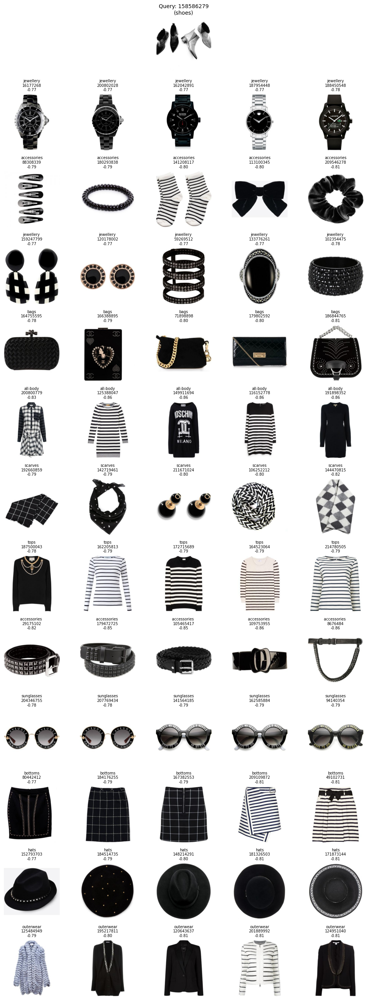

Processing Queries:  80%|████████  | 4/5 [06:11<01:32, 92.69s/it]


 Query: 124999565 (bags)
Top 5 from jewellery:
  179794245: -0.8013
  169213788: -0.8182
  194913033: -0.8335
  179661935: -0.8498
  149908693: -0.8525
Top 5 from shoes:
  213699346: -0.7117
  111472608: -0.7181
  190147466: -0.7186
  192574495: -0.7279
  172503813: -0.7295
Top 5 from accessories:
  203409791: -0.7092
  209706593: -0.7115
  164311405: -0.7154
  177395537: -0.7181
  125700308: -0.7233
Top 5 from jewellery :
  104278916: -0.7020
  104278930: -0.7101
  190685135: -0.7133
  178204221: -0.7155
  144895002: -0.7190
Top 5 from all-body:
  177968431: -0.7176
  208329171: -0.7235
  206915284: -0.7254
  201815911: -0.7291
  133118665: -0.7297
Top 5 from scarves:
  155149747: -0.6972
  179992440: -0.6981
  162024013: -0.7138
  210207035: -0.7204
  206402623: -0.7302
Top 5 from tops:
  80251060: -0.6913
  39885348: -0.6975
  168721665: -0.7006
  147312091: -0.7013
  112003459: -0.7015
Top 5 from accessories :
  95611044: -0.7212
  35305640: -0.7302
  102923417: -0.7964
  21357424

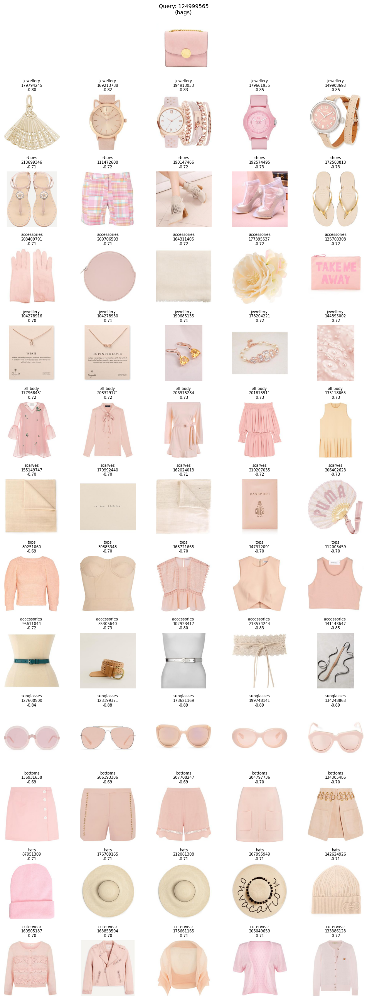

Processing Queries: 100%|██████████| 5/5 [07:45<00:00, 93.06s/it]


In [ ]:
results = []
# Loop over 1st 5 test outfits with progress bar
for i, outfit in enumerate(tqdm(test_outfits[:5], desc="Processing Queries")):
    query_id = str(outfit['items'][0]['item_id'])
    item_meta = metadata.get(query_id)

    if not item_meta:
        print(f"Skipping {query_id}: No metadata.")
        continue

    query_cat = item_meta.get('semantic_category')
    query_img_path = None

    for ext in ['jpg', 'jpeg', 'png']:
        temp_path = os.path.join(images_folder, f"{query_id}.{ext}")
        if os.path.isfile(temp_path):
            query_img_path = temp_path
            break

    if not query_img_path:
        print(f"Skipping {query_id}: No image found.")
        continue

    try:
        query_feat = extract_embedding(query_img_path)
    except Exception as e:
        print(f"Error loading query image {query_id}: {e}")
        continue

    top_matches = {}

    for gallery_id, g_feats in gallery_features.items():
        gallery_cat = g_feats.get("category")

        if gallery_cat == query_cat:
            continue

        gallery_feat = g_feats['visual'].to(device)
        gallery_hist = g_feats['hist'].to(device)

        vis_hadamard = query_feat["visual"] * gallery_feat
        hist_hadamard = query_feat["hist"] * gallery_hist
        pair_feat = torch.cat([vis_hadamard, hist_hadamard], dim=0).unsqueeze(0).to(device)

        with torch.no_grad():
            comp_score = metric_model(pair_feat).item()

        if gallery_cat not in top_matches:
            top_matches[gallery_cat] = []

        top_matches[gallery_cat].append((gallery_id, comp_score))

    for cat in top_matches:
        top_matches[cat] = sorted(top_matches[cat], key=lambda x: x[1], reverse=True)[:5]

    results.append({
        "query_id": query_id,
        "query_category": query_cat,
        "top_matches": top_matches
    })

    print(f"\n Query: {query_id} ({query_cat})")
    for cat, items in top_matches.items():
        print(f"Top 5 from {cat}:")
        for item_id, score in items:
            print(f"  {item_id}: {score:.4f}")
    show_query_and_top_matches(
        query_id=query_id,
        query_cat=query_cat,
        top_matches=top_matches,
        images_folder=images_folder,
        metadata=metadata
    )


In [27]:
import json

with open("/kaggle/working/results.json", "w") as f:
    json.dump(results, f, indent=2)

In [28]:
def compute_precision_at_k(results, test_outfits, metadata, k=5):
    total_precision = 0
    valid_count = 0

    # Create mapping from query_id to its full test outfit
    query_to_outfit = {
        str(outfit['items'][0]['item_id']): outfit for outfit in test_outfits
    }

    for res in results:
        query_id = res['query_id']
        top_matches = res['top_matches']
        outfit = query_to_outfit.get(query_id)

        if not outfit:
            continue

        # Build ground truth: category -> item_id, using metadata
        gt_complements = {}
        for item in outfit['items'][1:]:  # skip query
            item_id = str(item['item_id'])
            meta = metadata.get(item_id)
            if meta and 'semantic_category' in meta:
                cat = meta['semantic_category'].lower()
                gt_complements[cat] = item_id

        hits = 0
        count = 0

        for category, recommended_items in top_matches.items():
            gt_id = gt_complements.get(category.lower())
            if not gt_id:
                continue  # this category wasn't in the original outfit

            count += 1
            retrieved_ids = [item_id for item_id, _ in recommended_items[:k]]

            if gt_id in retrieved_ids:
                hits += 1

        if count > 0:
            precision = hits / count
            total_precision += precision
            valid_count += 1

    avg_precision_at_k = total_precision / valid_count if valid_count > 0 else 0
    return avg_precision_at_k


In [29]:
precision_at_5 = compute_precision_at_k(results, test_outfits, metadata, k=5)
print(f"Precision@5: {precision_at_5:.4f}")

Precision@5: 0.0000
